In [ ]:
import os
import os.path as osp
import cv2
import ipywidgets as widgets
import glob
import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as transforms

from google.colab.patches import cv2_imshow
from matplotlib import gridspec
from torch.optim import Adam, LBFGS
from torchvision.models import vgg19, VGG19_Weights
from tqdm import trange, tqdm

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cpu


In [ ]:
# Downloading ESRGAN and its' weights
!git clone https://github.com/xinntao/ESRGAN &> /dev/null
!rm /content/ESRGAN/LR/baboon.png &> /dev/null
!rm /content/ESRGAN/LR/comic.png &> /dev/null

!wget 'https://docs.google.com/uc?export=download&id=1TPrz5QKd8DHHt1k8SRtm6tMiPjz_Qene' -O /content/ESRGAN/models/RRDB_ESRGAN_x4.pth &> /dev/null

In [ ]:
%cd /content/ESRGAN/
import RRDBNet_arch as arch
%cd ..

/content/ESRGAN
/content


# Loading images

In [ ]:
!wget -O depth.png https://upload.wikimedia.org/wikipedia/commons/5/57/Deep_sea_corals%2C_Wagner_Seamount.jpg  &> /dev/null
!wget -O night.png https://upload.wikimedia.org/wikipedia/commons/thumb/e/ea/Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg/970px-Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg &> /dev/null
!wget -O movement.png https://upload.wikimedia.org/wikipedia/commons/0/08/Vassily_Kandinsky%2C_1935_-_Mouvement_1.jpg &> /dev/null

original_img - an image, which style we want to change  
style_img1, style_img2 - images which styles we want to take

In [ ]:
original_img = cv2.imread('depth.png')
style_img1 = cv2.imread('night.png')
style_img2 = cv2.imread('movement.png')

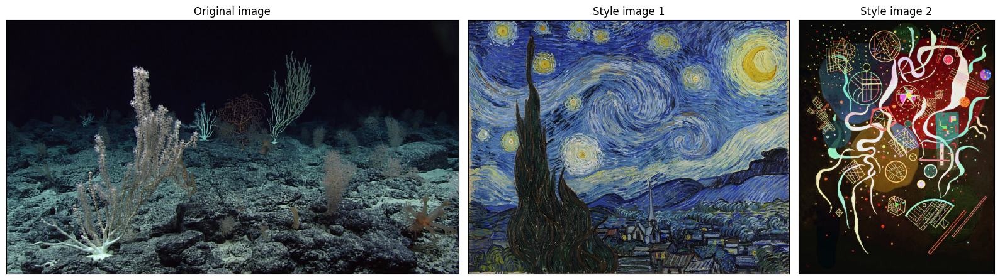

In [ ]:
fig = plt.figure(figsize=(16, 8))
gs = gridspec.GridSpec(
    1, 3,
    width_ratios=[
        original_img.shape[1]/original_img.shape[0],
        style_img1.shape[1]/style_img1.shape[0],
        style_img2.shape[1]/style_img2.shape[0],
    ]
)

ax0 = plt.subplot(gs[0])
ax0.imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
ax0.set_title('Original image')
ax0.set_xticks([])
ax0.set_yticks([])

ax1 = plt.subplot(gs[1])
ax1.imshow(cv2.cvtColor(style_img1, cv2.COLOR_BGR2RGB))
ax1.set_title('Style image 1')
ax1.set_xticks([])
ax1.set_yticks([])

ax2 = plt.subplot(gs[2])
ax2.imshow(cv2.cvtColor(style_img2, cv2.COLOR_BGR2RGB))
ax2.set_title('Style image 2')
ax2.set_xticks([])
ax2.set_yticks([])

plt.tight_layout()

# Image preparation

Colormap application is used as an auxillary function in image preparation. It is used on the original image before Laplacian pyramid downscaling. It is done so that when we upscale the stylized image, the restored features will be closer by color to the stylized image.

In [ ]:
def apply_colormap(original_img, colormap_img):
    '''
    A function to apply colormap of colormap image to original image
    original_img - np.array, original image in BGR format
    colormap_img - np.array, colormap image in BGR format
    '''
    original_lab = cv2.cvtColor(original_img, cv2.COLOR_BGR2LAB)
    colormap_lab = cv2.cvtColor(colormap_img, cv2.COLOR_BGR2LAB)

    original_ch = np.array(cv2.split(original_lab))
    colormap_ch = np.array(cv2.split(colormap_lab))

    result = original_ch - np.mean(original_ch, axis=(1, 2), keepdims=True)
    result *= np.std(colormap_ch, axis=(1, 2), keepdims=True)
    result /= np.std(original_ch, axis=(1, 2), keepdims=True)
    result += np.mean(colormap_ch, axis=(1, 2), keepdims=True)

    result = np.clip(result, 0, 255)
    result = cv2.merge(result)
    result = np.uint8(result)
    result = cv2.cvtColor(result, cv2.COLOR_LAB2BGR)
    return result

Let's look at an example of colormap transfer

In [ ]:
def plot_colormap_transfer(original_img, colormap_img):
    result = apply_colormap(original_img, colormap_img)

    fig = plt.figure(figsize=(16, 8))
    gs = gridspec.GridSpec(
        1, 3,
        width_ratios=[
            original_img.shape[1]/original_img.shape[0],
            colormap_img.shape[1]/colormap_img.shape[0],
            original_img.shape[1]/original_img.shape[0],
        ]
    )

    ax0 = plt.subplot(gs[0])
    ax0.imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
    ax0.set_title('Original image')
    ax0.set_xticks([])
    ax0.set_yticks([])

    ax1 = plt.subplot(gs[1])
    ax1.imshow(cv2.cvtColor(colormap_img, cv2.COLOR_BGR2RGB))
    ax1.set_title('Colormap image')
    ax1.set_xticks([])
    ax1.set_yticks([])

    ax2 = plt.subplot(gs[2])
    ax2.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
    ax2.set_title('Colored image')
    ax2.set_xticks([])
    ax2.set_yticks([])

    plt.tight_layout();

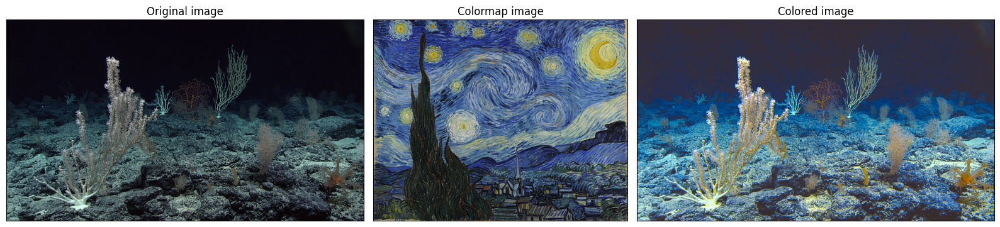

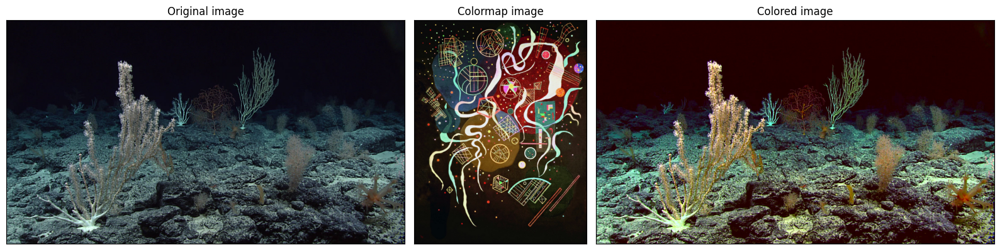

In [ ]:
plot_colormap_transfer(original_img, style_img1)
plot_colormap_transfer(original_img, style_img2)

Another auxillary method is upscaling with pretrained [ESRGAN](https://github.com/xinntao/ESRGAN). It can be used in upscaling process instead of some or all Lapacian pyramid upscaling steps.

In [ ]:
def ESRGAN_upscaler(image, model_path):
    '''
    4x Upscaling images with ESRGAN
    image - image to upscale
    model_path - path to model's weights
    '''

    model = arch.RRDBNet(3, 3, 64, 23, gc=32)
    model.load_state_dict(torch.load(model_path), strict=True)
    model.eval()
    model = model.to(device)

    img = image.copy()
    img = img * 1.0 / 255
    img = torch.from_numpy(np.transpose(img[:, :, [2, 1, 0]], (2, 0, 1))).float()
    img_LR = img.unsqueeze(0)
    img_LR = img_LR.to(device)

    with torch.no_grad():
        output = model(img_LR).data.squeeze().float().cpu().clamp_(0, 1).numpy()
    output = np.transpose(output[[2, 1, 0], :, :], (1, 2, 0))
    output = (output * 255.0).round()
    output = np.uint8(output)

    return output

Let's have a look at an example

In [ ]:
def plot_esrgan_upscale(small_img):
    result = ESRGAN_upscaler(
        small_img,
        'ESRGAN/models/RRDB_ESRGAN_x4.pth'
    )

    fig = plt.figure(figsize=(16, 8))
    gs = gridspec.GridSpec(
        1, 2,
        width_ratios=[
            small_img.shape[1],
            result.shape[1],
        ]
    )

    ax0 = plt.subplot(gs[0])
    ax0.imshow(cv2.cvtColor(small_img, cv2.COLOR_BGR2RGB))
    ax0.set_title('Original image')
    ax0.set_xticks([])
    ax0.set_yticks([])

    ax1 = plt.subplot(gs[1])
    ax1.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
    ax1.set_title('Upscaled image')
    ax1.set_xticks([])
    ax1.set_yticks([])

    plt.tight_layout();

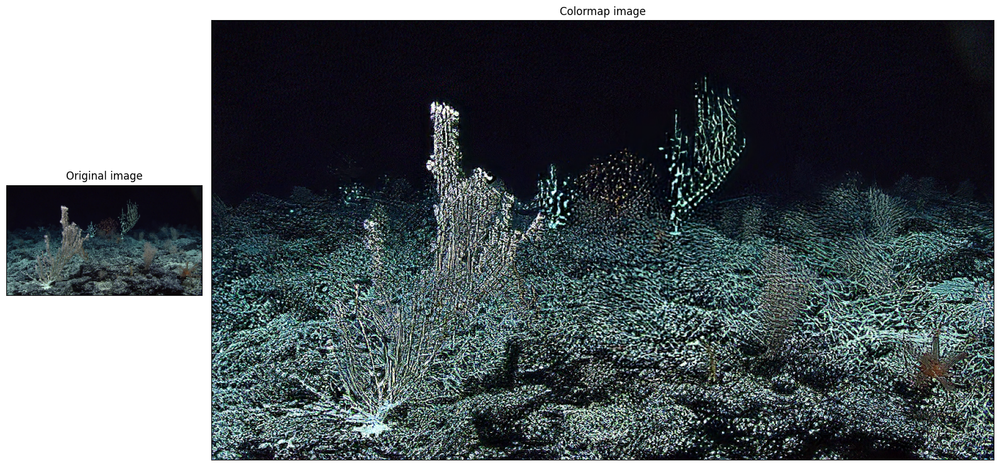

In [ ]:
plot_esrgan_upscale(
    cv2.resize(
        original_img,
        (int(135*original_img.shape[1]/original_img.shape[0]), 135))
)

Th eimage preparation is needed to convert images to format, compatible with PyTorch. Moreover, the image size is reduced, so that the computations could be held on CPU. We use the downsized image as the trainable image, but alternatively, we could use Gaussian Nose as a starter.     

More than that, the original image goes through a downscale process, during which a Laplacian pyramid is formed. It is needed so that we could conduct an upscale process to restore some image details.  

Alternatively, instead of Laplacian pyramid, we could use a pretrained ESRGAN model, as mentioned above.   

In [ ]:
class ImgPreparer():
    def __init__(self, original_img, style_img):
        '''
        original_img - image to be stylized
        style_img - source of style for original_img
        '''
        self.original = original_img
        self.style = style_img

    def downscale(
            self, downscale_limit,
            do_blur=True, blur_params={'ksize':(3, 3), 'sigmaX':1.5},
            apply_style_cmap=True
        ):
        '''
        Reduces the size of the image and prepares laplacians for further upscaling

        downscale_limit - maximum number of pixels in downscaled picture.
        do_blur - if True, gaussian blur is applied before downcaling
        blur_params - parameters of cv2.GaussianBlur
        apply_style_cmap - if True, colormap of style image is applied before downscaling
        '''

        downed = self.original.copy()
        if do_blur:
            downed = cv2.GaussianBlur(downed, **blur_params)
        if apply_style_cmap:
            downed = apply_colormap(downed, self.style)
        gaussian = [downed]
        while downed.shape[0] * downed.shape[1] > downscale_limit:
            downed = cv2.pyrDown(downed)
            gaussian.append(downed)
        self.gaussian = gaussian

        laplacian = [gaussian[-1]]
        for i in range(len(gaussian) - 1, 0, -1):
            h, w, _ = gaussian[i-1].shape
            up = cv2.pyrUp(gaussian[i], dstsize=(w, h))
            diff = cv2.subtract(gaussian[i-1], up)
            laplacian.append(diff)
        self.laplacian = laplacian

    def upscale(
            self, img,
            resize_only=False, use_ESRGAN=None,
            ESRGAN_weights_path='ESRGAN/models/RRDB_ESRGAN_x4.pth'
        ):
        '''
        Returns upscaled version of the image

        img - stylized original image to upscale.
        resize_only - if True, the image is only returned to it's original size
        use_ESRGAN - str or None.
        - If None - ESRGAN is not used
        - If 'first' - ESRGAN is used instead of first two pyramid upscales
        - If 'last' - ESRGAN is used instead of last two pyramid upscales
        - If  'all' - ESRGAN is used instead of all pyramid upscales

        Usin ESRGAN takes more time than upscaling with laplacian pyramids
        '''
        if resize_only:
            h, w, _ = self.laplacian[-1].shape
            resized = cv2.resize(img, (w, h))
            self.upscaled = upscaled = [img, resized]
            return resized

        current = img
        upscaled = [current]
        laplacian = self.laplacian
        if use_ESRGAN == 'all':
            # We one use of ESRGAN (x4) equals two uses of pyrUp (x2)
            for i in range(0, len(laplacian), 2):
                current = ESRGAN_upscaler(current, ESRGAN_weights_path)
                if i + 2 < len(laplacian):
                    h, w, _ = laplacian[i + 2].shape
                else:
                    h, w, _ = laplacian[-1].shape
                current = cv2.resize(current, (w, h))
                upscaled.append(current)
        else:
            lap_start = 1
            lap_end = len(laplacian)
            if use_ESRGAN == 'first':
                current = ESRGAN_upscaler(current, ESRGAN_weights_path)
                if len(laplacian) > 2:
                    h, w, _ = laplacian[2].shape
                else:
                    h, w, _ = laplacian[-1].shape
                current = cv2.resize(current, (w, h))
                upscaled.append(current)
                lap_start += 2
            elif use_ESRGAN == 'last':
                lap_end -= 2

            for i in range(lap_start, lap_end):
                h, w, _ = laplacian[i].shape
                current = cv2.pyrUp(current, dstsize=(w, h))
                current = cv2.add(current, laplacian[i])
                upscaled.append(current)

            if use_ESRGAN == 'last':
                current = ESRGAN_upscaler(current, ESRGAN_weights_path)
                h, w, _ = laplacian[-1].shape
                current = cv2.resize(current, (w, h))
                upscaled.append(current)

        self.upscaled = upscaled
        return current

    def prepare_imgs(
            self, start_from_gauss=False,
            apply_style_cmap=True, downscale_limit=35000):
        '''
        Function prepares original, style and input (trainable) images to style transfer with PyTorch.

        start_from_gauss - if True, the input image is constructed from gaussian noise;
        otherwise the original image is copied
        apply_style_cmap - if True, colormap of style image is to the input image.
        downscale_limit - maximum number of pixels in downscaled picture.
        Default is 35000, which is less than in 256x256 image, but more than in 128x128 image
        '''
        self.downscale(
            downscale_limit=downscale_limit,
            apply_style_cmap=apply_style_cmap
        )
        original = self.original.copy()
        style = self.style.copy()

        h, w, _ = self.gaussian[-1].shape

        if start_from_gauss:
            input = np.random.normal(size=original.shape)
            input = np.uint8(input*255)
        else:
            input = original.copy()
        if apply_style_cmap:
            input = apply_colormap(input, self.style)

        original = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)
        style = cv2.cvtColor(style, cv2.COLOR_BGR2RGB)
        input = cv2.cvtColor(input, cv2.COLOR_BGR2RGB)

        transformer = transforms.Compose([
            transforms.ToTensor(),
            transforms.Resize((h, w))]
        )
        original = transformer(original)
        original = original[None, ...]
        original = original.to(device, torch.float)

        style = transformer(style)
        style = style[None, ...]
        style = style.to(device, torch.float)

        input = transformer(input)
        input = input[None, ...]
        input = input.to(device, torch.float)


        return original, style, input

    def restore_img(self, img_, needs_upscale=False, upscale_params={}):
        '''
        Restores images from torch-suitable format to BGR numpy array
        '''
        if isinstance(img_, torch.Tensor):
            img = img_.clone()
            img = img.detach().cpu().numpy()
        else:
            img = img_.copy()
        img = img[0].swapaxes(0, 2).swapaxes(0, 1)
        img *= 255
        img = np.uint8(img)
        img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
        if needs_upscale:
            self.upscale(img, **upscale_params)
            img = self.upscaled[-1]
        return img

    def remove_color_noise(self, img, params={}):
        '''
        Removes color noise from image. Basically a wrapper for cv2.fastNlMeansDenoisingColored.

        img - image to remove color noise from
        h - parameter deciding filter strength. Higher h value removes noise better, but removes details of image also.
        hColor - same as h, but for color images only
        templateWindowSize - should be odd. Default: 5
        searchWindowSize - should be odd. Default: 10
        '''
        params_ = {
            'dst': None,
            'h': 5,
            'hColor': 2,
            'templateWindowSize': 5,
            'searchWindowSize': 10
        }
        for key in params:
            if key in params_:
                params_[key] = params[key]
        return cv2.fastNlMeansDenoisingColored(img, **params_)


# Defining model

In style transfer, instead of training a model, we are training and image. The loss function consideres both diviations from the original and style images by summing content and style loss.  

Content loss measures, how much our image deviates from the original image. It is defined as the MSE between images (more specifically, image representations in the network)

In [ ]:
class ContentLoss(nn.Module):
    def __init__(self, target,):
        super(ContentLoss, self).__init__()
        self.target = target.detach()

    def forward(self, input):
        self.loss = F.mse_loss(input, self.target)
        return input

Style loss measures, how the style of an image deviates from the style of style imgse. It is set as the MSE between the gram matrices of style and trainable images.

In [ ]:
def gram_matrix(input):
    a, b, c, d = input.size()
    features = input.reshape(a * b, c * d)
    G = torch.mm(features, features.t())
    return G.div(a * b * c * d)

In [ ]:
class StyleLoss(nn.Module):
    def __init__(self, target_features):
        super(StyleLoss, self).__init__()
        self.targets = []
        for target_feature in target_features:
            target = gram_matrix(target_feature).detach()
            self.targets.append(target)
        self.targets = torch.stack(self.targets)

    def forward(self, input):
        G = gram_matrix(input)
        self.loss = F.mse_loss(G.unsqueeze(0), self.targets)
        return input

For this task, we will use image representations (outputs of certain convolution layers) from pretrained VGG19 model.

In [ ]:
cnn = vgg19(weights=VGG19_Weights.DEFAULT).features.eval()
cnn_normalization_mean = torch.tensor([0.485, 0.456, 0.406])
cnn_normalization_std = torch.tensor([0.229, 0.224, 0.225])

Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:07<00:00, 77.5MB/s]


Vgg19 is divided into several blocks, with several convolutional layers in each.  Let's name the layers for convinience.

In [ ]:
def get_name_idx_dicts(cnn):
    conv_id = 1 # number of conv layer in block
    relu_id = 1 # number of relu layer in block
    block_id = 1 # number of the block
    # name example - 'conv_23' - third conv layer in the second block
    name2idx = dict()
    modules = dict(cnn.named_modules())
    for key, module in modules.items():
        if key == '':
            continue
        if isinstance(module, nn.Conv2d):
            name2idx[f'conv_{block_id}{conv_id}'] = key
            conv_id += 1
        elif isinstance(module, nn.ReLU):
            name2idx[f'relu_{block_id}{relu_id}'] = key
            relu_id += 1
        elif isinstance(module, nn.MaxPool2d):
            name2idx[f'pool_{block_id}'] = key
            block_id += 1
            conv_id = 1
            relu_id = 1
    idx2name = {v: k for k, v in name2idx.items()}
    return name2idx, idx2name

We don't need all the layers of the original model. We cut the model after the last  representation layer that we use. In this case, it is conv_31, a first convolution layer in the third block.  
After each layer, which image representation, we add a Styleloss or a ContentLoss block, so that we could extract loss values afterwards.

In [ ]:
# desired depth layers to compute style/content losses :
content_layers_default = ['conv_22']
style_layers_default = ['conv_11', 'conv_12', 'conv_21', 'conv_22', 'conv_31']

# additionaly, we normalize images the way they were normalized while Vgg19 was trained.
class Normalization(nn.Module):
    def __init__(self, mean, std):
        super(Normalization, self).__init__()
        self.mean = mean.clone().reshape(-1, 1, 1)
        self.std = std.clone().reshape(-1, 1, 1)

    def forward(self, img):
        return (img - self.mean) / self.std

def get_style_model_and_losses(
        cnn, normalization_mean, normalization_std,
        style_img, content_img,
        content_layers=content_layers_default,
        style_layers=style_layers_default
    ):

    name2idx, idx2name = get_name_idx_dicts(cnn)

    content_set = set(content_layers)
    style_set = set(style_layers)

    content_losses = []
    style_losses = []

    normalization = Normalization(normalization_mean, normalization_std)
    model = nn.Sequential(normalization)
    for idx, module in dict(cnn.named_modules()).items():
        if idx == '':
            continue
        if len(style_set) + len(content_set) < 1:
            break
        name = idx2name[idx]
        if 'relu' in name:
            model.add_module(name, nn.ReLU(inplace=False))
        else:
            model.add_module(name, module)
        if name in content_set:
            target = model(content_img).detach()
            content_loss = ContentLoss(target)
            model.add_module(f'content_loss_{name}', content_loss)
            content_losses.append(content_loss)
            content_set.remove(name)

        if name in style_layers:
            target_feature = model(style_img).detach()
            style_loss = StyleLoss([target_feature])
            model.add_module(f'style_loss_{name}', style_loss)
            style_losses.append(style_loss)
            style_set.remove(name)

    return model, style_losses, content_losses


We use LBFGS as an optimizer.

In [ ]:
def get_input_optimizer(input_img):
    optimizer = LBFGS([input_img])
    return optimizer

We define a function to train our image.

In [ ]:
def run_style_transfer(cnn, normalization_mean, normalization_std,
                       content_img, style_img, input_img, num_steps=300,
                       style_weight=1e6, content_weight=1):

    model, style_losses, content_losses = get_style_model_and_losses(cnn,
        normalization_mean, normalization_std, style_img, content_img)

    input_img.requires_grad_(True)
    model.eval()
    model.requires_grad_(False)

    optimizer = get_input_optimizer(input_img)

    imgs=[]
    run = [0]
    pbar = tqdm(total=num_steps, position=0, leave=True)
    while run[0] <= num_steps:

        def closure():
            # correct the values of updated input image
            with torch.no_grad():
                input_img.clamp_(0, 1)

            optimizer.zero_grad()
            model(input_img)

            # get losses
            style_score = 0
            content_score = 0
            for sl in style_losses:
                style_score += sl.loss
            for cl in content_losses:
                content_score += cl.loss

            style_score *= style_weight
            content_score *= content_weight

            loss = style_score + content_score
            loss.backward()

            # progressbar update
            run[0] += 1
            pbar.update(1)
            pbar.set_description(
                f'Style Loss : {style_score.item():.4}, '
                f' Content Loss: {content_score.item():.4}'
            )
            # saving intermediate results
            imgs.append(input_img.clone().clamp_(0, 1).detach().cpu().numpy())
            return style_score + content_score

        optimizer.step(closure)


    with torch.no_grad():
        input_img.clamp_(0, 1)

    imgs.append(input_img.clone().detach().cpu().numpy())

    return input_img, imgs

# Style Transfer

Defining a simple function to look how our image changed during stylization

In [ ]:
def display_changes(imgs):
    image_list = []
    for img in imgs:
        img = img[0]
        img = img.swapaxes(0, 1).swapaxes(1, 2)*255
        img = np.uint8(img)
        image_list.append(img)

    def f(idx):
        plt.imshow(image_list[idx])
        plt.show()

    interactive_plot = widgets.interactive(f, idx=(0, len(imgs)-1))
    output = interactive_plot.children[-1]
    output.layout.height = '350px'
    return interactive_plot

Let's run our model, using the style of The Starry Night

In [ ]:
preparer_1 = ImgPreparer(original_img, style_img1)
content_img, style_img, input_img_1 = preparer_1.prepare_imgs()
output_1, image_list_1 = run_style_transfer(
    cnn, cnn_normalization_mean, cnn_normalization_std,
    content_img, style_img, input_img_1, num_steps=300,
    style_weight=1e5, content_weight = 1)

Building the style transfer model..
Optimizing..


Style Loss : 1.129,  Content Loss: 6.161: : 320it [02:21,  2.26it/s]


We can take a look at the process

In [ ]:
display_changes(image_list_1)

interactive(children=(IntSlider(value=160, description='idx', max=320), Output(layout=Layout(height='350px')))…

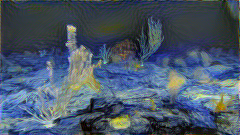

In [ ]:
styled_depth = preparer_1.restore_img(output_1)
cv2_imshow(styled_depth)

Smoothing the image now helps reduce the noise later

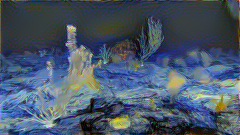

In [ ]:
params_ = {
    'h': 5,
    'hColor': 2,
    'templateWindowSize': 5,
    'searchWindowSize': 10
}
smooth_depth = preparer_1.remove_color_noise(styled_depth, params_)
cv2_imshow(smooth_depth)

In [ ]:
# This takes ~11 minutes because of the full ERSGAN upscale

laplace_depth = preparer_1.upscale(smooth_depth)
resized_depth = preparer_1.upscale(smooth_depth, resize_only=True)
first_e_depth = preparer_1.upscale(smooth_depth, use_ESRGAN='first')
last_e_depth = preparer_1.upscale(smooth_depth, use_ESRGAN='last')
all_e_depth = preparer_1.upscale(smooth_depth, use_ESRGAN='all')

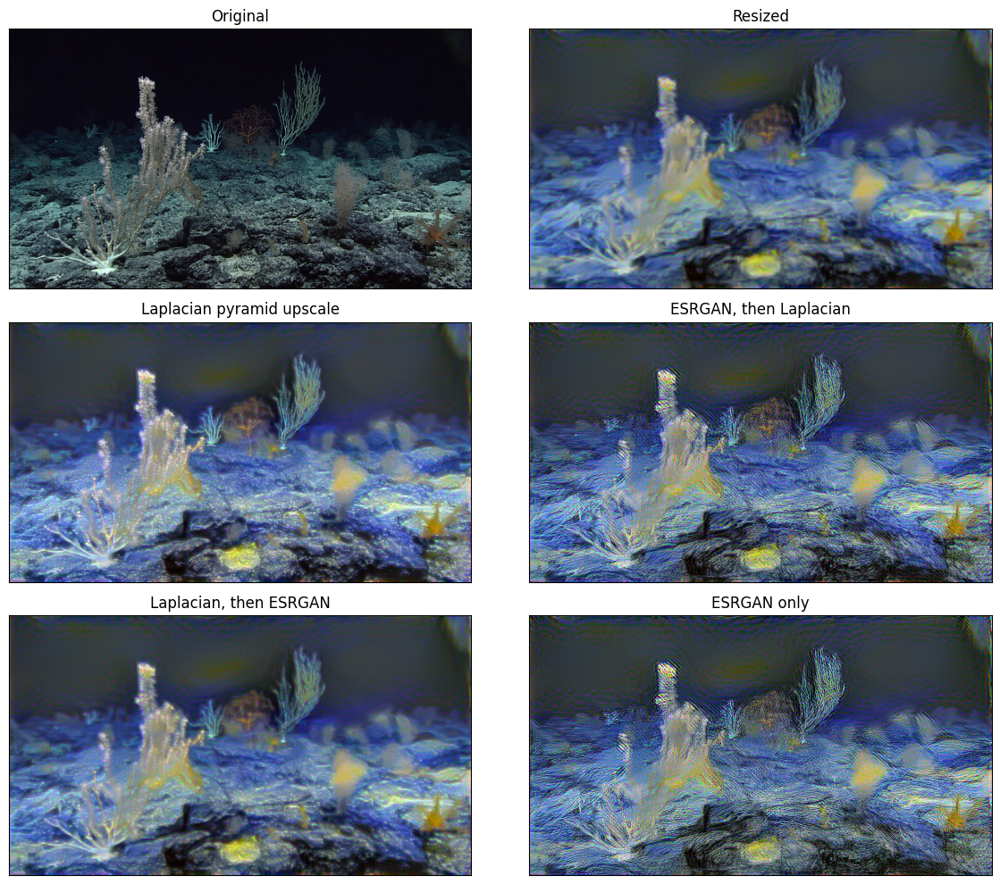

In [ ]:
upscales = [original_img, resized_depth, laplace_depth,
            first_e_depth, last_e_depth, all_e_depth]
names = ['Original', 'Resized', 'Laplacian pyramid upscale',
         'ESRGAN, then Laplacian', 'Laplacian, then ESRGAN',
         'ESRGAN only']
plt.figure(figsize=(12, 10))
for i, (img, name) in enumerate(zip(upscales, names)):
    plt.subplot(3, 2, i+1)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
    plt.title(name)
plt.tight_layout()

We can try the same with the Movement I by Wassily Kandinsky.

In [ ]:
preparer_2 = ImgPreparer(original_img, style_img2)
content_img, style_img, input_img_2 = preparer_2.prepare_imgs()
output_2, image_list_2 = run_style_transfer(
    cnn, cnn_normalization_mean, cnn_normalization_std,
    content_img, style_img, input_img_2, num_steps=300,
    style_weight=1e6, content_weight = 1)

Building the style transfer model..
Optimizing..


Style Loss : 10.4,  Content Loss: 32.71: : 320it [02:16,  2.34it/s]


In [ ]:
display_changes(image_list_2)

interactive(children=(IntSlider(value=160, description='idx', max=320), Output(layout=Layout(height='350px')))…

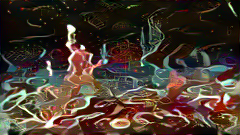

In [ ]:
styled_depth_2 = preparer_2.restore_img(output_2)
cv2_imshow(styled_depth_2)

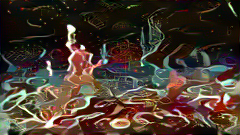

In [ ]:
smooth_depth_2 = preparer_2.remove_color_noise(styled_depth_2, params_)
cv2_imshow(smooth_depth_2)

In [ ]:
# This takes ~11 minutes because of the full ERSGAN upscale

laplace_depth = preparer_2.upscale(smooth_depth_2)
resized_depth = preparer_2.upscale(smooth_depth_2, resize_only=True)
first_e_depth = preparer_2.upscale(smooth_depth_2, use_ESRGAN='first')
last_e_depth = preparer_2.upscale(smooth_depth_2, use_ESRGAN='last')
all_e_depth = preparer_2.upscale(smooth_depth_2, use_ESRGAN='all')

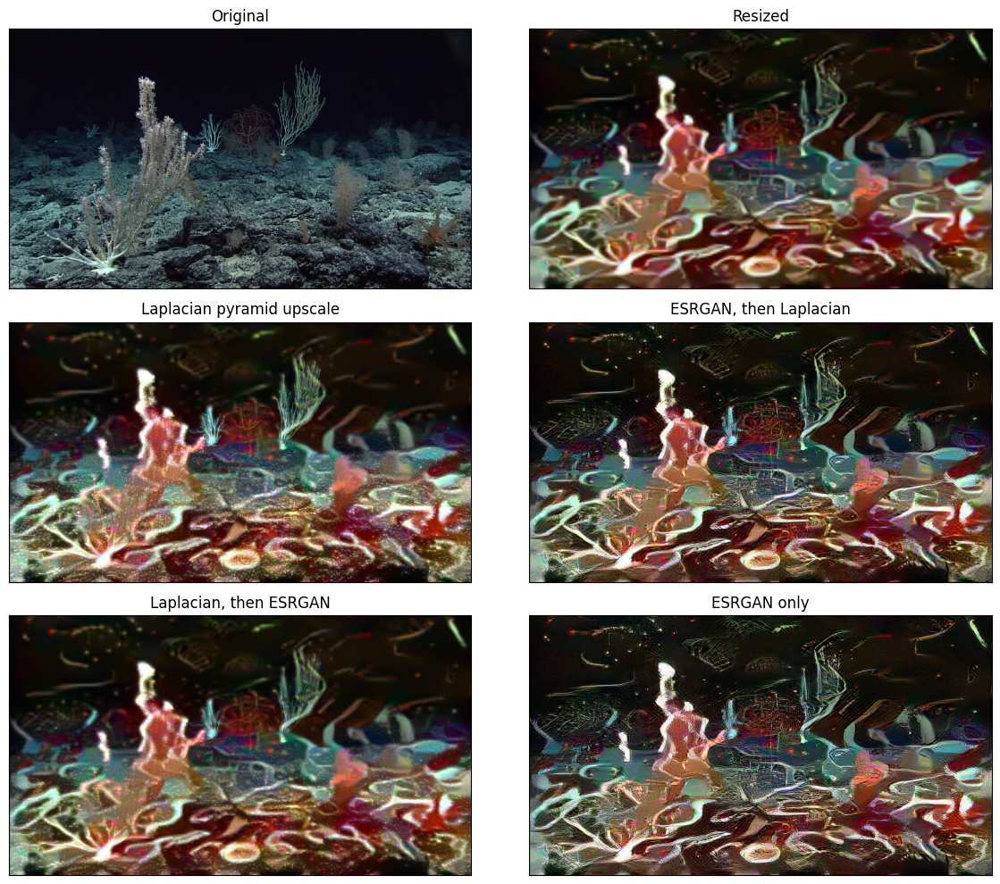

In [ ]:
upscales = [original_img, resized_depth, laplace_depth,
            first_e_depth, last_e_depth, all_e_depth]
names = ['Original', 'Resized', 'Laplacian pyramid upscale',
         'ESRGAN, then Laplacian', 'Laplacian, then ESRGAN',
         'ESRGAN only']
plt.figure(figsize=(12, 10))
for i, (img, name) in enumerate(zip(upscales, names)):
    plt.subplot(3, 2, i+1)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
    plt.title(name)
plt.tight_layout()